In [27]:
import math
from skimage import io, color
from skimage.transform import resize
import numpy as np
import cv2
import matplotlib.pyplot as plt
import time
import os

In [28]:
class SuperPixel:
    def __init__(self, l, a, b, h, w):
        self.l = l  # L component of LAB color
        self.a = a  # A component of LAB color
        self.b = b  # B component of LAB color
        self.h = h  # y-coordinate (height) of cluster center
        self.w = w  # x-coordinate (width) of cluster center
        self.pixels = []  # List to store the pixels belonging to this cluster

    def add_pixel(self, pixel):
        self.pixels.append(pixel)  # Add pixel to the cluster
        
    def update(self, h, w, l, a, b):
        self.h = h
        self.w = w
        self.l = l
        self.a = a
        self.b = b

In [29]:
def initial_cluster_center(S, img, img_h, img_w):
    clusters = []  # List to store cluster centers
    for y in range(S // 2, img_h, S):
        for x in range(S // 2, img_w, S):
            L, A, B = img[y, x]  # Get LAB color at (x, y)
            cluster = SuperPixel(L, A, B, y, x)  # Create a SuperPixel object
            clusters.append(cluster)
    return clusters


In [32]:
import numpy as np

def initialize_labels_and_distances(img_h, img_w):
    """
    Initializes the label and distance arrays for SLIC.

    Parameters:
    - img_h: Image height
    - img_w: Image width

    Returns:
    - tag: A 2D array (img_h, img_w) initialized to -1 (labels)
    - dis: A 2D array (img_h, img_w) initialized to infinity (distances)
    """
    tag = np.full((img_h, img_w), -1, dtype=np.int32)  # Set all labels to -1
    dis = np.full((img_h, img_w), np.inf, dtype=np.float32)  # Set all distances to infinity
    
    return tag, dis


In [33]:
def assign_pixels_to_cluster(clusters, S, img, img_h, img_w, tag, dis, m=10):
    """
    Assigns each pixel to the nearest cluster based on the SLIC distance metric.

    Parameters:
    - clusters: List of SuperPixel objects
    - S: Superpixel step size
    - img: Image in LAB color space
    - img_h: Image height
    - img_w: Image width
    - tag: 2D array storing cluster labels for each pixel
    - dis: 2D array storing minimum distances for each pixel
    - m: Compactness factor (higher = more compact superpixels)

    Returns:
    - Updated `tag` and `dis` arrays with assigned clusters
    """
    for k, cluster in enumerate(clusters):
        L_k, A_k, B_k, x_k, y_k = cluster.l, cluster.a, cluster.b, cluster.w, cluster.h
        
        # Search in a (2S x 2S) neighborhood around each cluster center
        for dy in range(-S, S + 1):
            for dx in range(-S, S + 1):
                x_i, y_i = x_k + dx, y_k + dy
                
                # Ensure (x_i, y_i) is within image bounds
                if 0 <= x_i < img_w and 0 <= y_i < img_h:
                    y_i,x_i = int(y_i),int(x_i)
                    
                    L_i, A_i, B_i = img[y_i, x_i]  # Get LAB values
                    
                    # Compute color distance (d_c)
                    d_c = np.sqrt((L_k - L_i) ** 2 + (A_k - A_i) ** 2 + (B_k - B_i) ** 2)
                    
                    # Compute spatial distance (d_s)
                    d_s = np.sqrt((x_k - x_i) ** 2 + (y_k - y_i) ** 2)
                    
                    # Compute SLIC distance (D)
                    D = np.sqrt((d_c / m) ** 2 + (d_s / S) ** 2)
                    
                    # Assign pixel to cluster if this distance is smaller
                    if D < dis[y_i, x_i]:
                        dis[y_i, x_i] = D
                        tag[y_i, x_i] = k  # Assign cluster label
                        
                        # Add the pixel to the cluster's pixels list
                        cluster.add_pixel((y_i, x_i))
    
    return tag, dis


In [34]:
def update_cluster_mean(clusters, tag, img, img_h, img_w):
    """
    Updates cluster centers by computing the mean LAB color and (x, y) position
    of all pixels assigned to each cluster.

    Parameters:
    - clusters: List of SuperPixel objects
    - tag: 2D array storing cluster labels for each pixel
    - img: Image in LAB color space
    - img_h: Image height
    - img_w: Image width

    Returns:
    - Updated list of clusters
    """
    for c in clusters:
        sum_h = sum_w = number = 0
        
        for p in c.pixels:  # Iterate over all pixels assigned to this cluster
            h, w = p  # Pixel coordinates
            sum_h += h
            sum_w += w
            number += 1

        if number > 0:  # Avoid division by zero
            H = sum_h // number  # Mean y-coordinate
            W = sum_w // number  # Mean x-coordinate
            
            c.update(H, W, img[H, W][0], img[H, W][1], img[H, W][2])  # Update cluster center

    return clusters


In [35]:
def update_image_with_superpixel_colors(img,name ,clusters):
    """
    Updates the image by setting all pixels in each superpixel cluster to the average color
    of that cluster. The cluster center is set to black.
    
    Parameters:
    - img: The original image in LAB color space.
    - clusters: List of clusters, each containing pixel indices and average LAB color.
    
    Returns:
    - The updated image with the new colors for each superpixel.
    """
    # Make a copy of the image to avoid modifying the original one
    image = np.copy(img)
    
    # Iterate over all the clusters
    for c in clusters:
        # Loop over each pixel in the cluster and update the pixel's color
        for p in c.pixels:
            image[p[0], p[1]] = [c.l, c.a, c.b]  # Update pixel with cluster's average LAB values
        
        # Set the cluster center (h, w) to black (LAB: [0, 0, 0])
        image[int(c.h), int(c.w)] = [0, 0, 0]
    lab2rgb(name, image)


In [39]:
def slic(S,m,img,img_h,img_w,tag,dis):
    clusters = initial_cluster_center(S, img, img_h, img_w)
    name = 'out_m{m}_k{k}.png'.format(m=m, k=k)
    for i in range(10): # usually the algortihm converges within 10 iterations
        # print(i)
        assign_pixels_to_cluster(clusters, S, img, img_h, img_w, tag, dis,m)
        update_cluster_mean(clusters, tag, img, img_h, img_w)
        # if i == 9 : # to print the output after 10 iterations
        update_image_with_superpixel_colors(img,name, clusters)
        # else:
        #     lab2rgb(name,img)
        segmented_img = cv2.imread(name)
        if segmented_img is not None:
            segmented_img = cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            # Display the image without printing unwanted info
            plt.imshow(segmented_img)
            plt.axis("off")  # Hide axes
            plt.show()
            # Close the figure to avoid debug prints
            plt.close()
            
    return clusters

In [40]:
# function to convert LAB images back to RGB and save it
def lab2rgb(path, lab_arr):
    rgb_arr = color.lab2rgb(lab_arr)
    rgb_arr = (rgb_arr * 255).astype(np.uint8)
    io.imsave(path, rgb_arr)

In [41]:
img = io.imread('Copy of frame_0000.jpg')
print(img.shape)

img = color.rgb2lab(img)

img_h = img.shape[0]
img_w = img.shape[1]

N = img_h * img_w

k = 100   # Number of Super pixels
m = 20    # Constant for normalizing the color proximity, range of m = [1,40]

S = int(np.sqrt(N/k))

tag,dis = initialize_labels_and_distances(img_h, img_w)


(1080, 1920, 3)


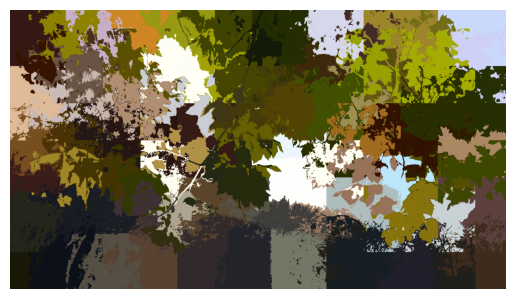

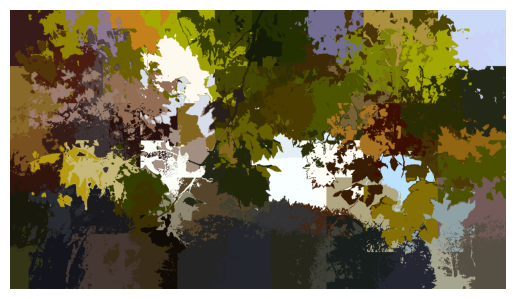

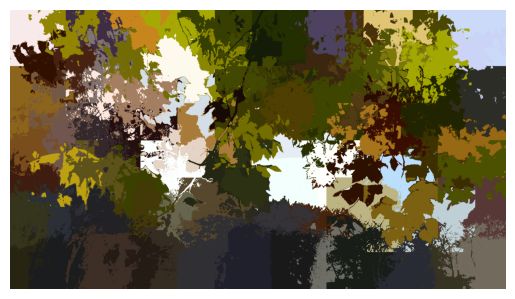

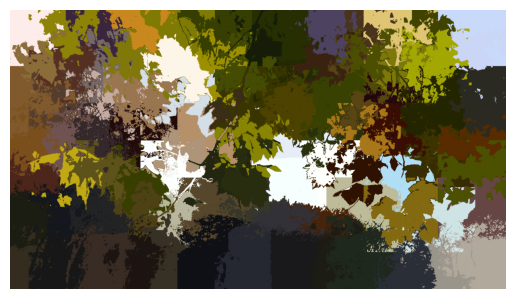

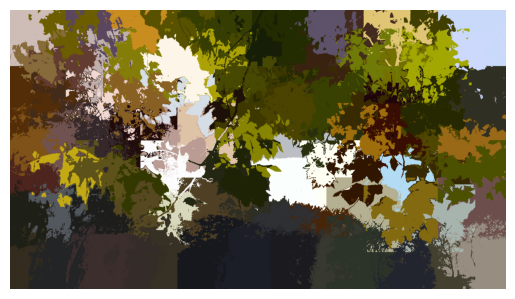

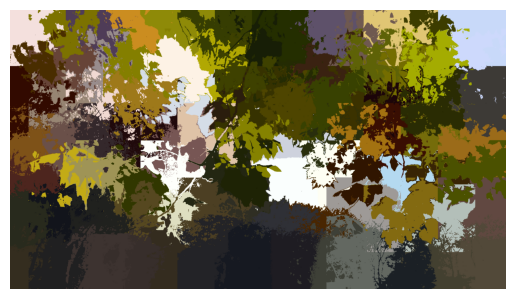

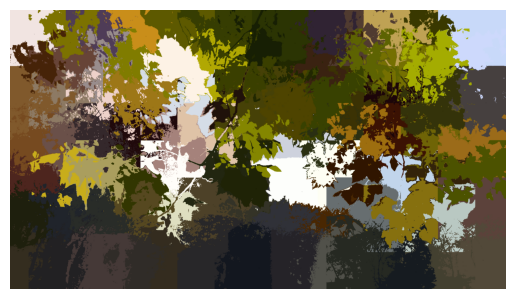

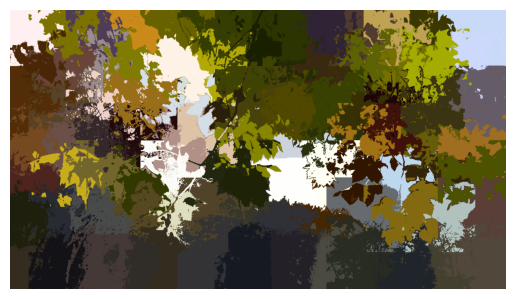

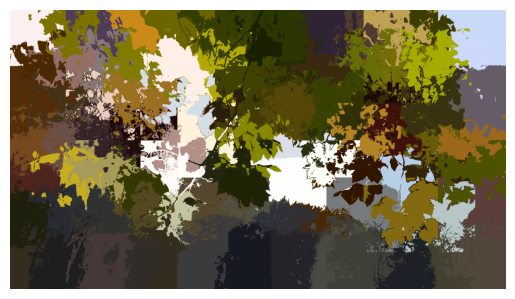

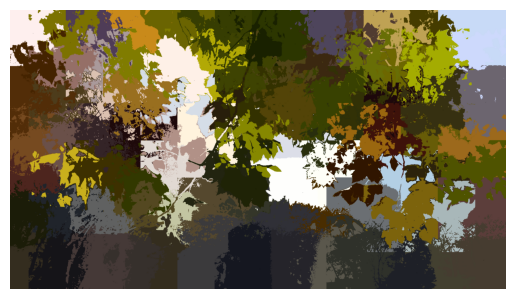

time taken: 274.5992


In [42]:
start = time.time()
clusters = slic(S,m,img,img_h,img_w,tag,dis)
end = time.time()
print(f"time taken: {(end-start):.4f}")

At k = 100 and m = 10


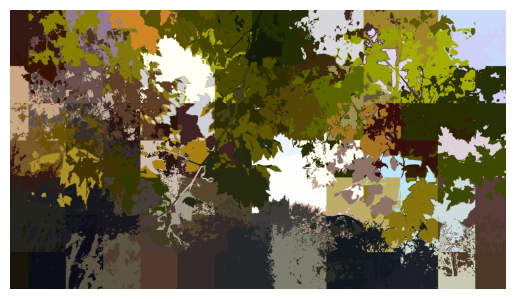

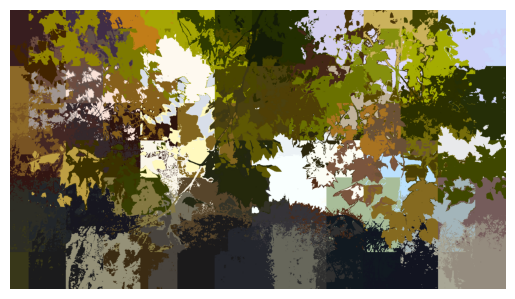

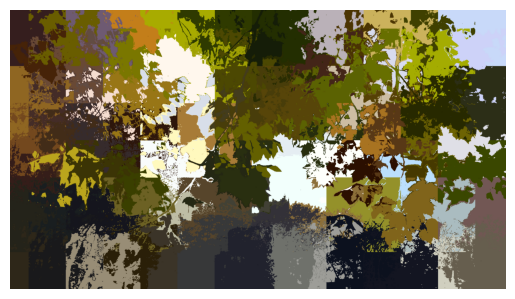

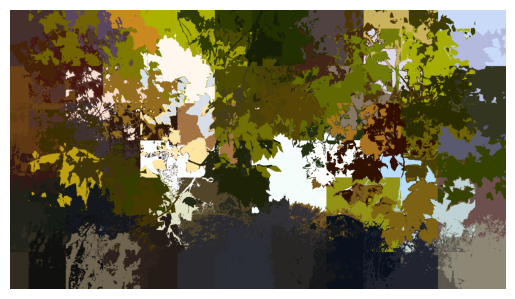

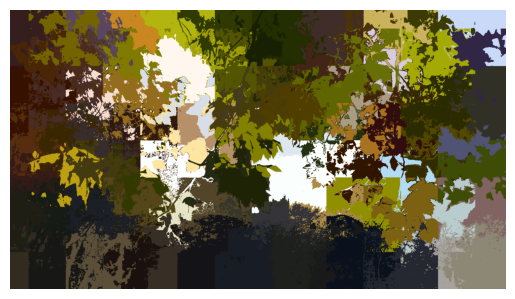

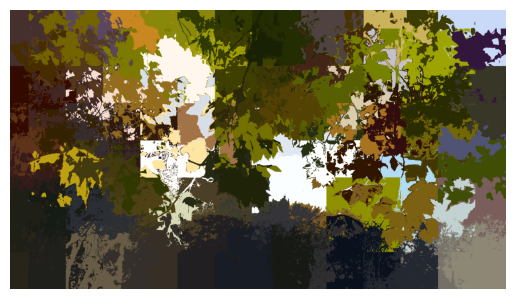

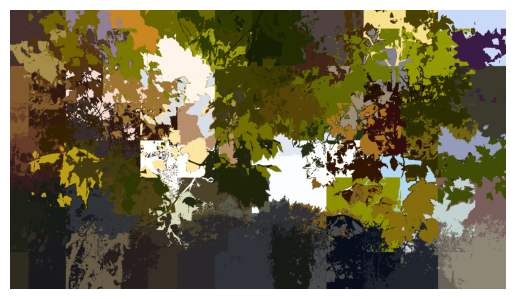

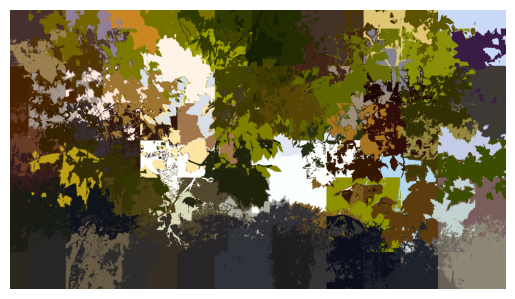

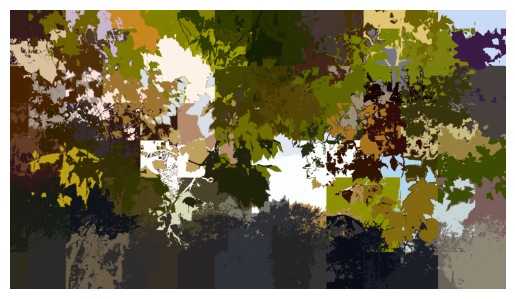

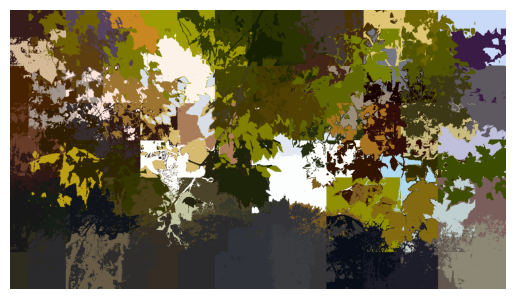

At k = 50 and m = 20


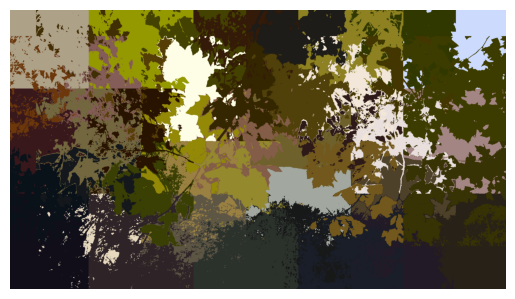

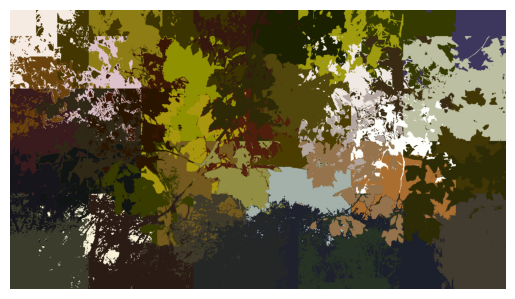

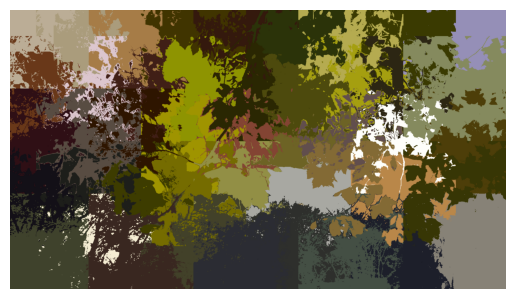

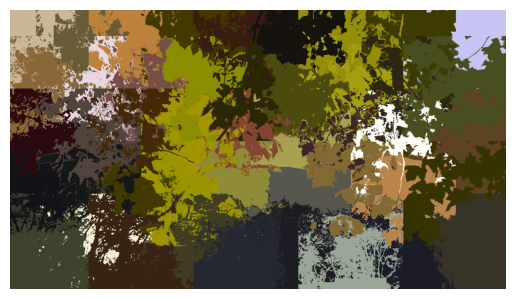

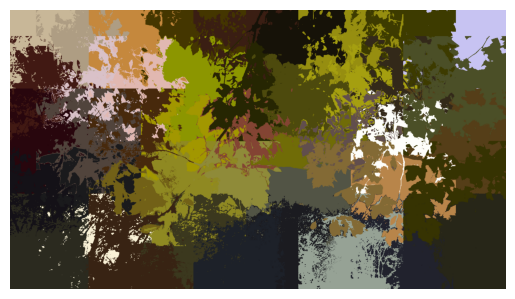

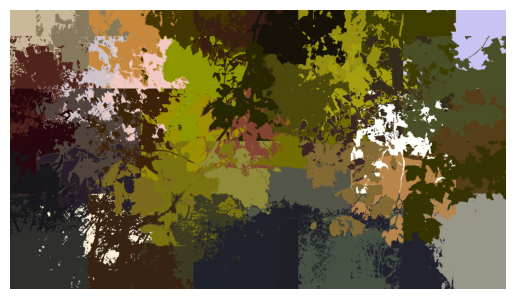

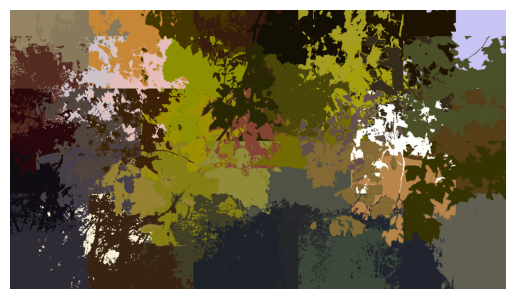

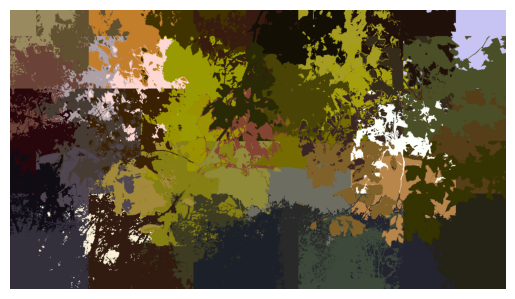

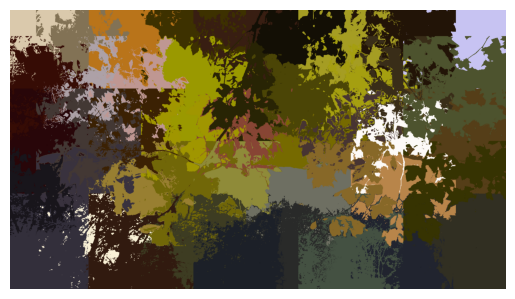

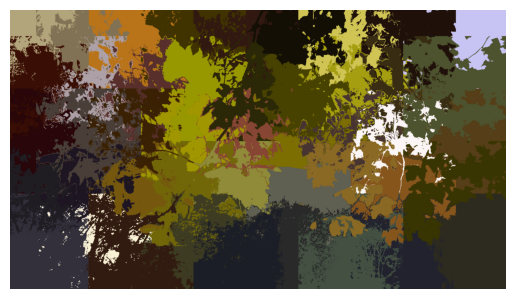

At k = 50 and m = 10


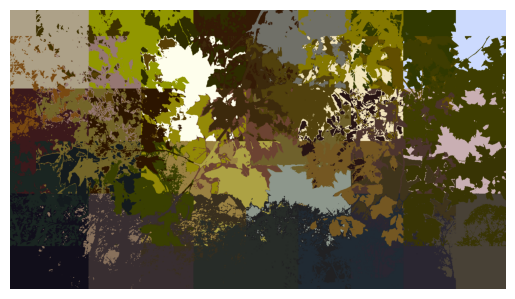

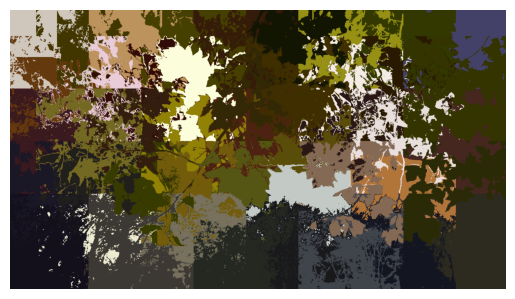

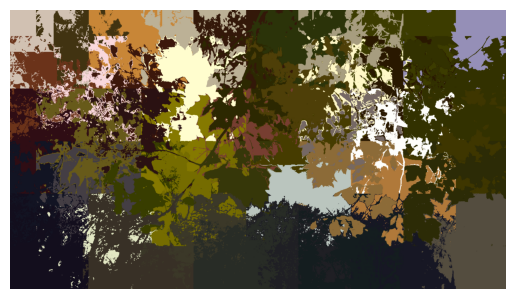

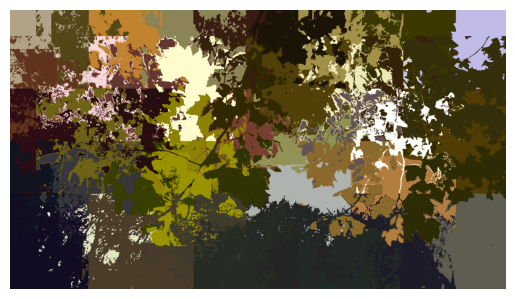

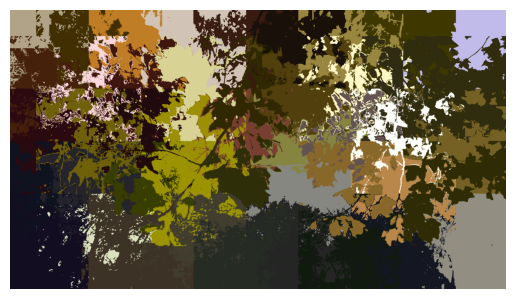

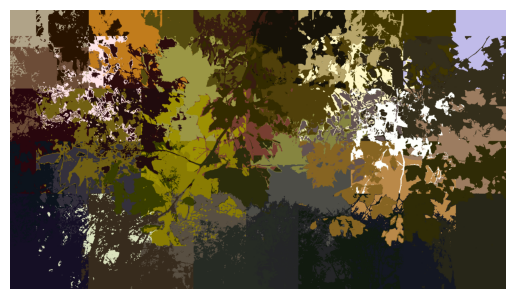

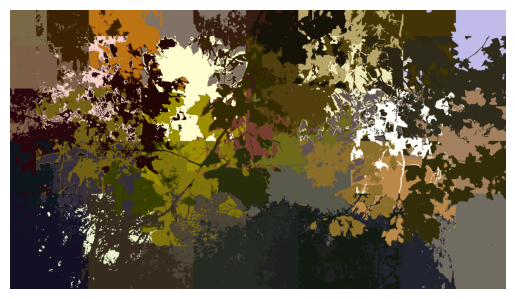

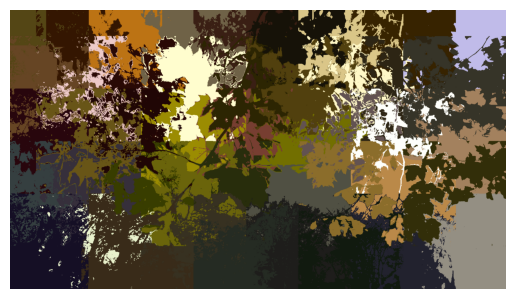

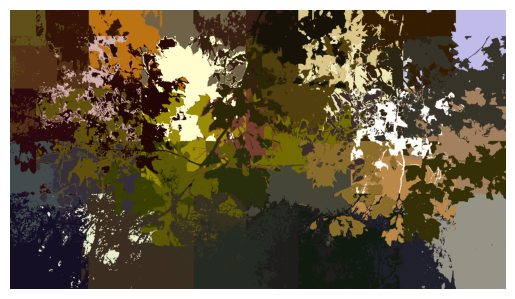

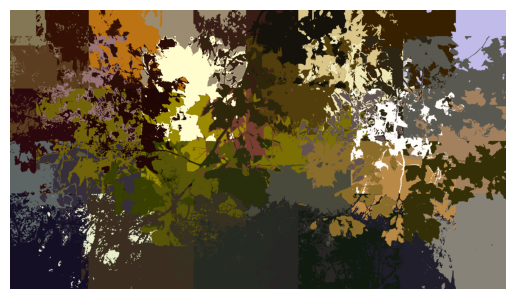

time taken: 792.8958


In [43]:
start = time.time()
k = 100
m = 10
S = int(np.sqrt(N/k))
tag,dis = initialize_labels_and_distances(img_h, img_w)
print(f"At k = {k} and m = {m}")
clusters = slic(S,m,img,img_h,img_w,tag,dis)

k = 50
m = 20
S = int(np.sqrt(N/k))
tag,dis = initialize_labels_and_distances(img_h, img_w)
print(f"At k = {k} and m = {m}")
clusters = slic(S,m,img,img_h,img_w,tag,dis)

k = 50 
m = 10
S = int(np.sqrt(N/k))
tag,dis = initialize_labels_and_distances(img_h, img_w)
print(f"At k = {k} and m = {m}")
clusters = slic(S,m,img,img_h,img_w,tag,dis)

end = time.time()
print(f"time taken: {(end-start):.4f}")

In [25]:
def assign_pixels_to_cluster_r(clusters, S, img, img_h, img_w, tag, dis, m=10):
    for k, cluster in enumerate(clusters):
        L_k, A_k, B_k, x_k, y_k = map(float, [cluster.l, cluster.a, cluster.b, cluster.w, cluster.h])
        # Search in a (2S x 2S) neighborhood around each cluster center
        for dy in range(-S, S + 1):
            for dx in range(-S, S + 1):
                x_i, y_i = x_k + dx, y_k + dy
                
                # Ensure (x_i, y_i) is within image bounds
                if 0 <= x_i < img_w and 0 <= y_i < img_h:
                    y_i,x_i = int(y_i),int(x_i)
                    
                    L_i, A_i, B_i = img[y_i, x_i]  # Get LAB values
                    
                    # Compute color distance (d_c)
                    d_c = np.sqrt((L_k - L_i) ** 2 + (A_k - A_i) ** 2 + (B_k - B_i) ** 2)
                    
                    # Compute spatial distance (d_s)
                    d_s = np.sqrt((x_k - x_i) ** 2 + (y_k - y_i) ** 2)
                    
                    # Compute SLIC distance (D)
                    D = np.sqrt((d_c / m) ** 2 + (d_s / S) ** 2)
                    
                    # Assign pixel to cluster if this distance is smaller
                    if D < dis[y_i, x_i]:
                        dis[y_i, x_i] = D
                        tag[y_i, x_i] = k  # Assign cluster label
                        
                        # Add the pixel to the cluster's pixels list
                        cluster.add_pixel((y_i, x_i))
    
    return tag, dis


def update_image_with_superpixel_colors_r(img, name, clusters):

    # Make a copy of the original image
    image = np.copy(img)

    # Iterate over all the clusters
    for c in clusters:
        # Loop over each pixel in the cluster and update it with the cluster's average RGB color
        for p in c.pixels:
            image[p[0], p[1]] = [c.l, c.a, c.b]  # Use RGB values
        
        # Set the cluster center to black
        image[int(c.h), int(c.w)] = [0, 0, 0]  # Black in RGB

    # Ensure the image is in uint8 format for correct saving
    image = np.clip(image, 0, 255).astype(np.uint8)

    # Save the updated image without converting to LAB
    io.imsave(name, image)

def slic_r(S,m,img,img_h,img_w,tag,dis):
    clusters = initial_cluster_center(S, img, img_h, img_w)
    name = 'out_m{m}_k{k}.png'.format(m=m, k=k)
    for i in range(10): # usually the algortihm converges within 10 iterations
        # print(i)
        assign_pixels_to_cluster_r(clusters, S, img, img_h, img_w, tag, dis,m)
        update_cluster_mean(clusters, tag, img, img_h, img_w)
        # if i == 9 : # to print the output after 10 iterations
        update_image_with_superpixel_colors_r(img,name, clusters)
        # else:
        #     lab2rgb(name,img)
        segmented_img = cv2.imread(name)
        if segmented_img is not None:
            segmented_img = cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            # Display the image without printing unwanted info
            plt.imshow(segmented_img)
            plt.axis("off")  # Hide axes
            plt.show()
            # Close the figure to avoid debug prints
            plt.close()
            
    return clusters




With RGB instead of lab


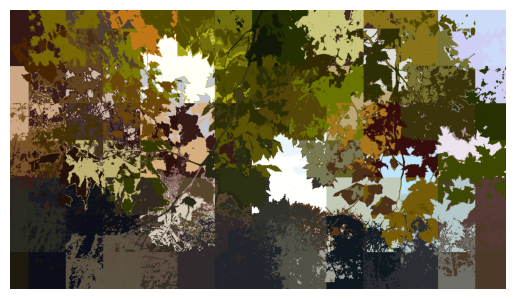

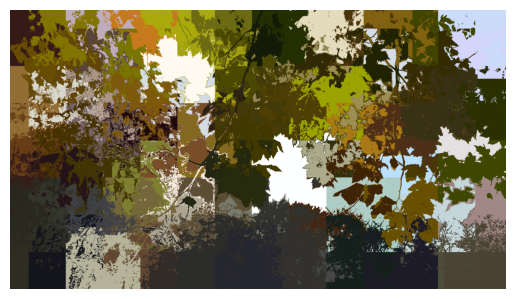

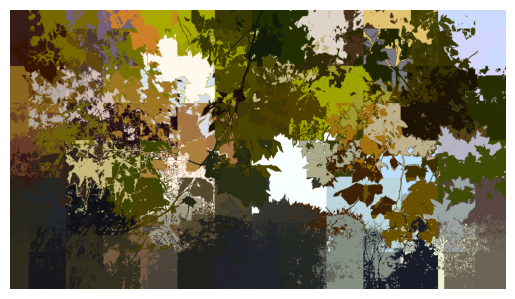

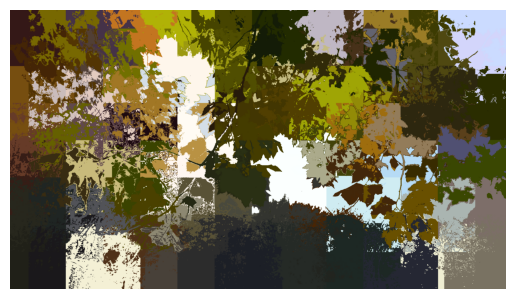

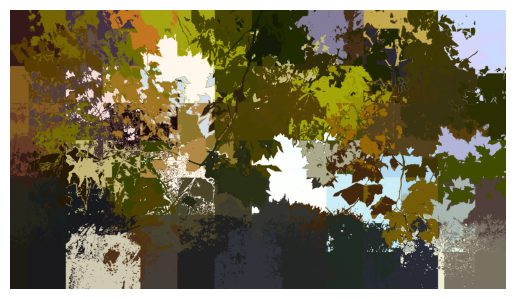

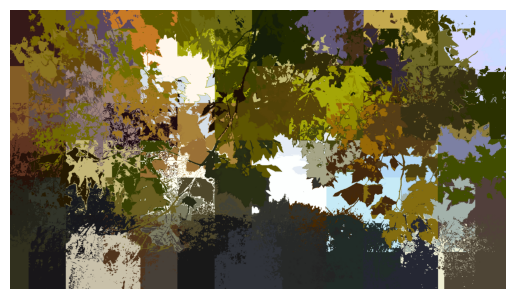

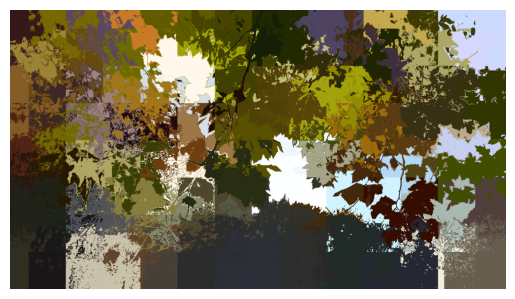

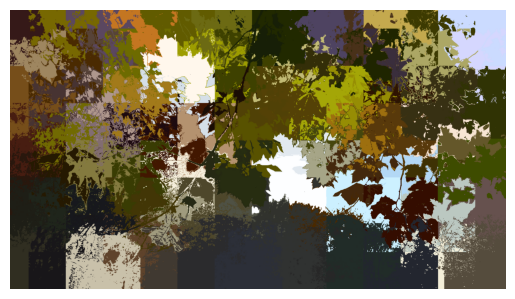

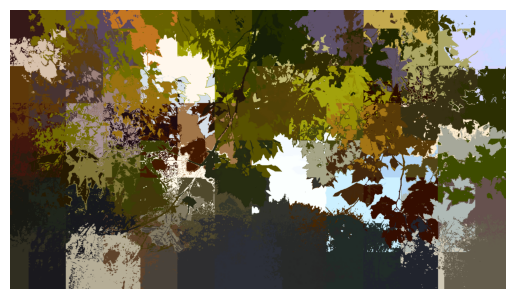

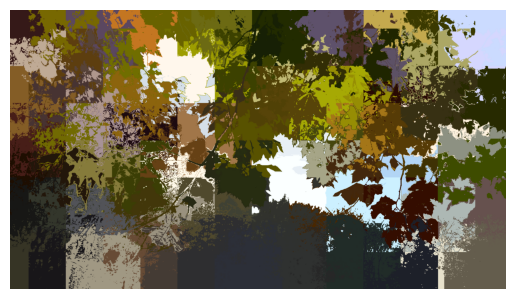

time taken: 407.2881


In [26]:
#with RGB
start = time.time()
img = io.imread('Copy of frame_0000.jpg')
img_h = img.shape[0]
img_w = img.shape[1]

N = img_h * img_w

k = 100   # Number of Super pixels
m = 20    # Constant for normalizing the color proximity, range of m = [1,40]

S = int(np.sqrt(N/k))

tag,dis = initialize_labels_and_distances(img_h, img_w)

print("With RGB instead of lab")

clusters = slic_r(S,m,img,img_h,img_w,tag,dis)
end = time.time()
print(f"time taken: {(end-start):.4f}")

### Video

In [30]:
def slic_video(S, img, img_h, img_w, tag, dis, output_dir, image_name):
    clusters = initial_cluster_center(S, img, img_h, img_w)
    move_to_lowest_gradient(img, img_w, img_h, clusters)
    for i in range(10):  # usually the algorithm converges within 10 iterations
        assign_pixels_to_cluster(clusters, S, img, img_h, img_w, tag, dis)
        update_cluster_mean(clusters, tag, img, img_h, img_w)
        if i == 9:  # to print and save the output after 10 iterations
            name = os.path.join(output_dir, f"{image_name}")
            update_image_with_superpixel_colors(img, name, clusters)
            segmented_img = cv2.imread(name)
            if segmented_img is not None:
                segmented_img = cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
                plt.imshow(segmented_img)
                plt.axis("off")  # Hide axes
                plt.show()
                plt.close()
    return clusters


In [23]:

def create_video(frame_paths, output_video_path, fps):
    if not frame_paths:
        print("No frames to create a video.")
        return

    first_frame = cv2.imread(frame_paths[0])
    height, width, layers = first_frame.shape
    frame_size = (width, height)

    fourcc = cv2.VideoWriter_fourcc(*'mp4v') 
    out = cv2.VideoWriter(output_video_path, fourcc, fps, frame_size)

    for frame_path in frame_paths:
        frame = cv2.imread(frame_path)
        out.write(frame)  

    out.release()
    print(f"Video saved to {output_video_path}")





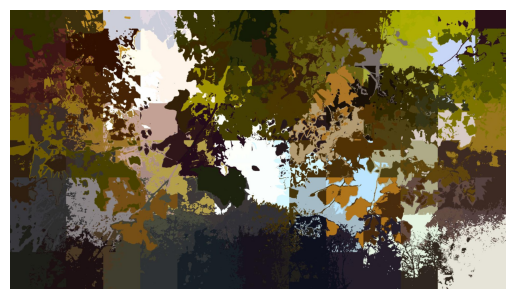

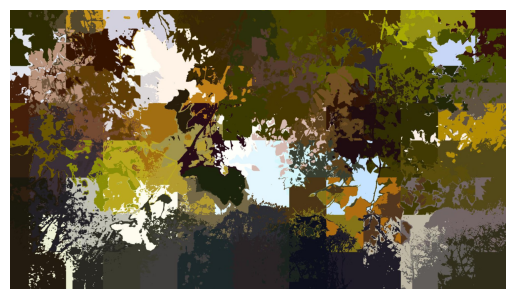

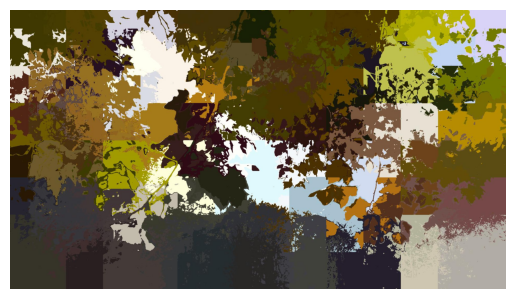

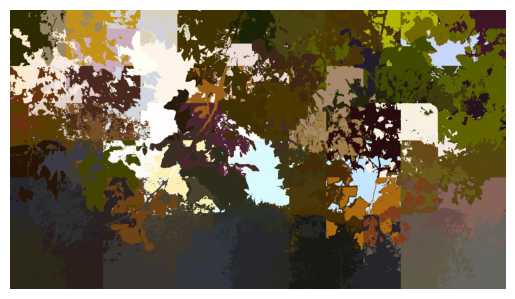

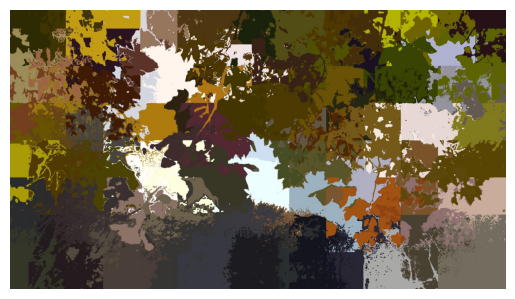

...

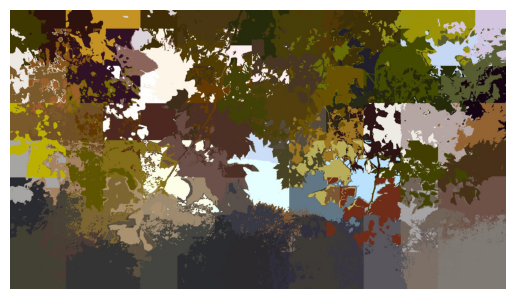

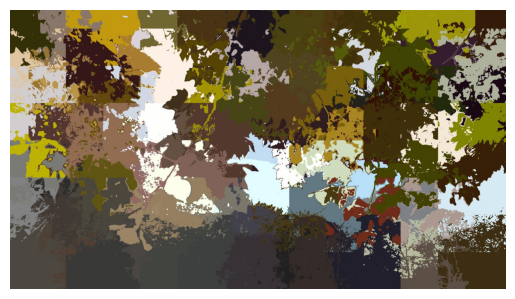

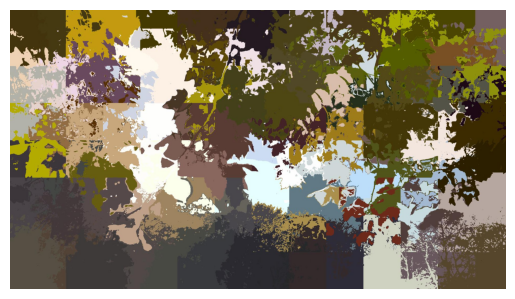

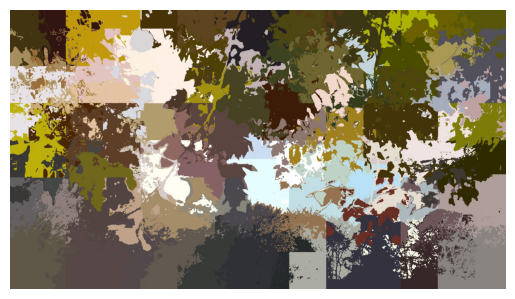

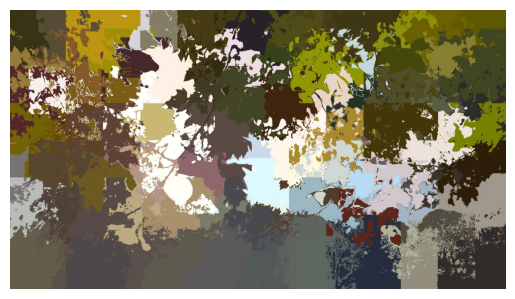

time taken: 2774.7303


In [31]:
start = time.time()

# Path to frames folder
frames_folder = "frames"

# Get all image filenames in the folder
image_files = sorted([f for f in os.listdir(frames_folder) if f.startswith("frame_") and f.endswith(".jpg")])

output_dir = "output"
os.makedirs(output_dir, exist_ok=True)

# Process images sequentially
for image_file in image_files:
    image_path = os.path.join(frames_folder, image_file)
    img = io.imread(image_path)
    
    img = color.rgb2lab(img)
    img_h, img_w = img.shape[:2]
    N = img_h * img_w

    k = 100  # Number of superpixels
    m = 20   # Normalizing constant
    S = int(np.sqrt(N / k))

    tag, dis = initialize_labels_and_distances(img_h, img_w)

    clusters = slic_video(S, img, img_h, img_w, tag, dis, output_dir, image_file)
end = time.time()
print(f"time taken: {(end-start):.4f}")


In [29]:
output_folder = "output"       
output_video_path = "output_video.mp4" 
fps = 10

frame_paths = [f'output/frame_{i:04d}.jpg' for i in range(65, 76)]
create_video(frame_paths, output_video_path, fps)

Video saved to output_video.mp4


### Optimized video

In [15]:


def slic_video(S, img, img_h, img_w, tag, dis, image_name, output_dir, prev_clusters=None, iter_count=10):
    """
    SLIC for video frames. Uses previous frame's clusters to reduce iterations.
    """
    if prev_clusters is None:
        clusters = initial_cluster_center(S, img, img_h, img_w)  # First frame: Initialize clusters
    else:
        clusters = prev_clusters  # Use previous frame’s clusters for faster convergence

    for i in range(iter_count):  # Perform all but the last iteration
        assign_pixels_to_cluster(clusters, S, img, img_h, img_w, tag, dis)
        update_cluster_mean(clusters, tag, img, img_h, img_w)

    # Final iteration: Update cluster means before saving
    # assign_pixels_to_cluster(clusters, S, img, img_h, img_w, tag, dis)
    # update_cluster_mean(clusters, tag, img, img_h, img_w)  

    # Construct output image filename and save the final image
    output_path = os.path.join(output_dir, image_name)  
    update_image_with_superpixel_colors(img, output_path, clusters)

    return clusters  # Return clusters for next frame


# Path to frames folder
frames_folder = "frames"

# Get all image filenames in the folder
image_files = sorted([f for f in os.listdir(frames_folder) if f.startswith("frame_") and f.endswith(".jpg")])

output_dir = "output_optimized"
os.makedirs(output_dir, exist_ok=True)

start = time.time()

prev_clusters = None  # Store previous frame's clusters
first_frame_iters = 10  # Use 10 iterations for the first frame
subsequent_frame_iters = 4  # Use only 3 iterations for subsequent frames

# Process images sequentially
for i, image_file in enumerate(image_files):
    print(i)
    image_path = os.path.join(frames_folder, image_file)
    rgb = io.imread(image_path)

    img = resize(rgb, (338,600),anti_aliasing=True)
    
    img = color.rgb2lab(img)
    img_h, img_w = img.shape[:2]
    N = img_h * img_w

    k = 100  # Number of superpixels
    m = 20   # Normalizing constant
    S = int(np.sqrt(N / k))

    tag, dis = initialize_labels_and_distances(img_h, img_w)

    iter_count = first_frame_iters if i % 3 == 0 else subsequent_frame_iters  # Reduce iterations for later frames

    print(iter_count)

    prev_clusters = slic_video(S, img, img_h, img_w, tag, dis, image_file, output_dir, prev_clusters, iter_count)

end = time.time()
print(f"Total time taken: {(end-start):.4f} seconds")


0
10
1
4
2
4
3
10
4
4
5
4
6
10
7
4
8
4
9
10
10
4
Total time taken: 370.7807 seconds


In [18]:
output_folder = "output_optimized"       
output_video_path = "output_video_optimized.mp4" 
fps = 10

frame_paths = [f'output/frame_{i:04d}.jpg' for i in range(65, 76)]
create_video(frame_paths, output_video_path, fps)

Video saved to output_video_optimized.mp4
